In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [2]:
from fastbook import *

In [3]:
# we will using imagenette data
path = untar_data(URLs.IMAGENETTE)

In [4]:
dblock = DataBlock(blocks=(ImageBlock(), CategoryBlock()),
                   get_items=get_image_files,
                   get_y=parent_label,
                   item_tfms=Resize(460),
                   batch_tfms=aug_transforms(size=224, min_scale=0.75))
dls = dblock.dataloaders(path, bs=64)

In [5]:
model = xresnet18()
learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=accuracy)
try:
  learn.fit_one_cycle(5, 3e-3)
except:
  print("fit one cycle failed.")

KeyboardInterrupt: ignored

When training a model, it helps if your input data is normalized—that is, has a mean of 0 and a standard deviation of 1. But most images and computer vision libraries use values between 0 and 255 for pixels, or between 0 and 1; in either case, your data is not going to have a mean of 0 and a standard deviation of 1.

Let's grab a batch of our data and look at those values, by averaging over all axes except for the channel axis, which is axis 1:

In [7]:
# normalisation

x, y =  dls.one_batch()
x.mean(dim=[0,2,3]), x.std(dim=[0,2,3])

(TensorImage([0.4941, 0.4864, 0.4597]), TensorImage([0.2879, 0.2887, 0.3090]))

In [10]:
x[0].shape

torch.Size([3, 224, 224])

In [18]:
from fastai.vision import *
import torchvision.transforms as T


img = x[0]
# df = pd.DataFrame(img[0])
# df.style.background_gradient('Greys')

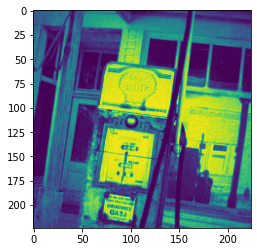

In [20]:
plt.imshow(img[0])

In [29]:
x.mean(dim=[0,2,3])
# takes mean accross 1 dimension, that is three channels

TensorImage([0.4941, 0.4864, 0.4597])

In [16]:
# %debug

# it can be used immediately after an error

> <ipython-input-15-58a3fcf48628>(6)<module>()
      2 import torchvision.transforms as T
      3 
      4 
      5 img = x[0]
----> 6 Image(img)

ipdb> img.shape
torch.Size([3, 224, 224])
ipdb> type(Image)
<class 'module'>
--KeyboardInterrupt--
ipdb> exit()
ipdb> quit


it is much easir to Normalise in pytorch. this can be added to batch_tfms to normalise entire mini batch at once.

We can add this using `imagenet_stats`

In [30]:
def get_dls(bs, size):
  dblock = DataBlock(blocks=(ImageBlock, CategoryBlock),
                     get_items=get_image_files,
                     get_y=parent_label,
                     item_tfms=Resize(460),
                     batch_tfms=[*aug_transforms(size=size, min_scale=0.75),
                                 Normalize.from_stats(*imagenet_stats)])
  return dblock.dataloaders(path, bs=bs)

In [31]:
dls= get_dls(64, 224)

In [32]:
x,y = dls.one_batch()
x.mean(dim=[0,2,3]),x.std(dim=[0,2,3])

(TensorImage([-0.0660,  0.0423,  0.1626]),
 TensorImage([1.2359, 1.2289, 1.2984]))

In [ ]:
# we can check what effect it had on the data by
# model = xresnet50()
# learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=accuracy)
# learn.fit_one_cycle(5, 3e-3)

#I am not gonna try though

In this case it might help just a little but the normalisation becomes very important with pretrained models.

In previous chapters when we were using cnn learner we didnt need to use normalisation

we can also change the size of the image starting from low down to 224 .

The way to do it would be to start with training on a small size

In [34]:
# dls = get_dls(128,128)

# learn = Learner(dls, xresnet50(), loss_func=CrossEntropyLossFlat(),metrics=accuracy)
# learn.fit_one_cycle(4, 3e-3)

KeyboardInterrupt: ignored

then we replace the dataloaders inside the learner and then fine tune it further

In [ ]:
# learn.dls = get_dls(64, 224)
# learn.fine_tune(5, 1e-3)

On the other hand, if the transfer learning task is going to use images that are of different sizes, shapes, or styles than those used in the pretraining task, progressive resizing will probably help.

TTA or test time augmentation is nothing but increasing the number of features 

In [ ]:
# preds, targs = learn.tta()
# accuracy(preds, targs).item()

Mixup works as follows, for each image:

Select another image from your dataset at random.
Pick a weight at random.
Take a weighted average (using the weight from step 2) of the selected image with your image; this will be your independent variable.
Take a weighted average (with the same weight) of this image's labels with your image's labels; this will be your dependent variable.

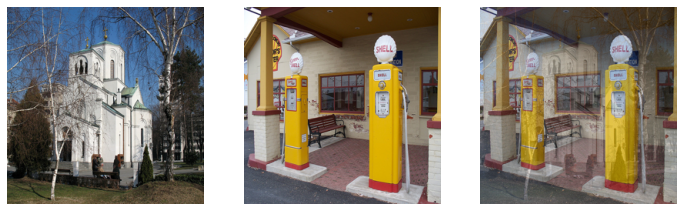

In [40]:
church = PILImage.create(get_image_files_sorted(path/'train'/'n03028079')[0])
gas = PILImage.create(get_image_files_sorted(path/'train'/'n03425413')[0])

church = church.resize((256,256))
gas = gas.resize((256,256))
tchurch = tensor(church).float()/255.b
tgas = tensor(gas).float()/255.

_, axs =  plt.subplots(1,3,figsize=(12,4))
show_image(tchurch, ax=axs[0])
show_image(tgas, ax=axs[1])
show_image((0.3*tchurch + 0.7*tgas), ax=axs[2])

In [ ]:
# this is already implemented in cbs Mixup

# model = xresnet50()
# learn = Learner(dls, model, loss_func=CrossEntropyLossFlat(), metrics=accuracy, cbs=Mixup)
# learn.fit_one_cycle(5,3e-3b)

During one hot encoding our prediction take in a binary either 0 or 1 but then it might create overfitting

especially if the data is not perfectly labelled

if we replace all our numbers with a number less than 1 and zeros with a number less than zero this is called label smoothing


In [ ]:
# model = xresnet50()

# learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=accuracy)
# learn.fit_one_cycle(5, 3e-3)